<table class="table table-bordered">
    <tr>
        <th style="text-align:center; vertical-align: middle; width:50%"><img src='https://www.np.edu.sg/images/default-source/default-album/img-logo.png'"></th>
        <th style="text-align:center;"><h1>Deep Learning</h1><h2>Assignment - Food Classification Model (Individual)</h2><h3>AY2025/26 Semester</h3></th>
    </tr>
</table>

## Student Name: Lim Ai Sim Elizabeth (ID: 3440680F)</h3>

# **NOTEBOOK 2**

## **Introduction**

This notebook contains codes that continued the model development from notebook 1 where a model was put together, trained, adjusted and evaluated. In this notebook, the model development now includes data augmentation. It was hoped that the initial adjustments would have made the model the best it could be for image classification task, and data augmentation would further improve model training and performance.

Note that the observations and changes are not always recorded in this notebook, rather an excel sheet was used to compare graphs and note down observations.

(Gemini in Google Colab was also use to help generate and debug some of the codes used in this notebook.)

### Import Libraries and environmental setup

In [ ]:
# FOR AWS setup only

!ln -sf /opt/conda/nvvm/libdevice/libdevice.10.bc ./libdevice.10.bc

In [ ]:
# Import the Required Packages

from tensorflow import keras
print('keras: ', keras.__version__)
# Keras version must be at least 2.6.0


keras:  3.8.0


In [ ]:
# FOR COLAB: Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


## **1) Data import, transformation and exploration**

In [ ]:
# FOR COLAB: Data loading from drive

import os
import zipfile


# # Define the path to your zip file and the target directory for extraction
# zip_file_path = '/content/drive/My Drive/Colab Notebooks/DLIR/Food.zip'
extract_dir = '/content/drive/My Drive/Colab Notebooks/DLIR/'


# #Extract the zip file (commented out once extracted)
# # with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
# #     zip_ref.extractall(extract_dir)

# Define paths to the train, validation, and test directories
train_dir = os.path.join(extract_dir, 'Food', 'train')
validation_dir = os.path.join(extract_dir, 'Food','validation')
test_dir = os.path.join(extract_dir, 'Food','test')

# check path
print(train_dir)
print(validation_dir)
print(test_dir)

/content/drive/My Drive/Colab Notebooks/DLIR/Food/train
/content/drive/My Drive/Colab Notebooks/DLIR/Food/validation
/content/drive/My Drive/Colab Notebooks/DLIR/Food/test


In [ ]:
# FOR AWS: Data loading

import os
import zipfile


# # Define the path to your zip file and the target directory for extraction
# zip_file_path = 'Food.zip'
# extract_dir = os.getcwd()

# # Extract the zip file (commented out once extracted)
# with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
#     zip_ref.extractall(extract_dir)

# Define paths to the train, validation, and test directories
train_dir = 'Food/train'
validation_dir = 'Food/validation'
test_dir = 'Food/test'

# check path
print(train_dir)
print(validation_dir)
print(test_dir)

Food/train
Food/validation
Food/test


### Check and view the images

Checking first 3 images in subfolders of: Food/train
  Subfolder: beet_salad


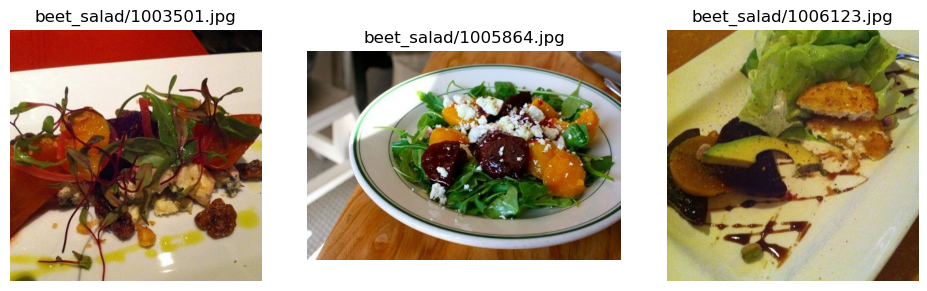

  Subfolder: beignets


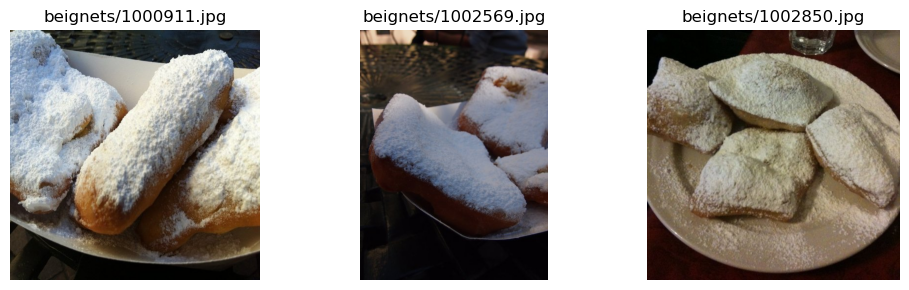

  Subfolder: eggs_benedict


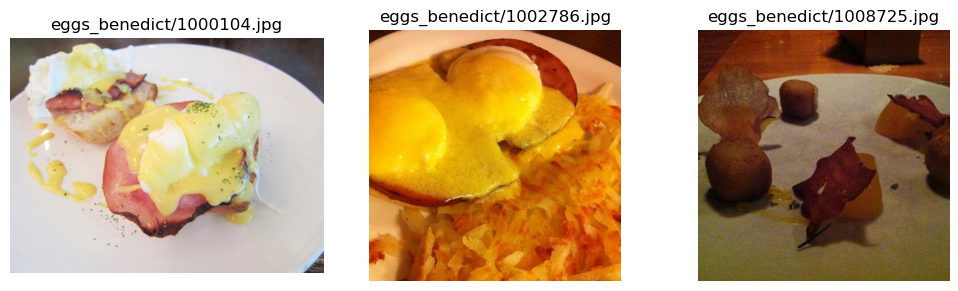

  Subfolder: hamburger


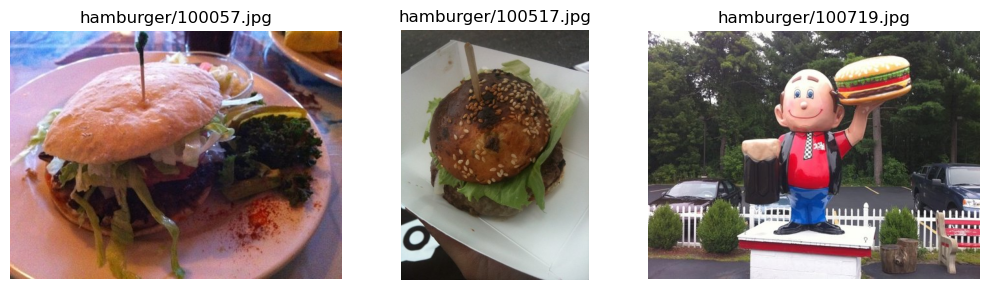

  Subfolder: hot_and_sour_soup


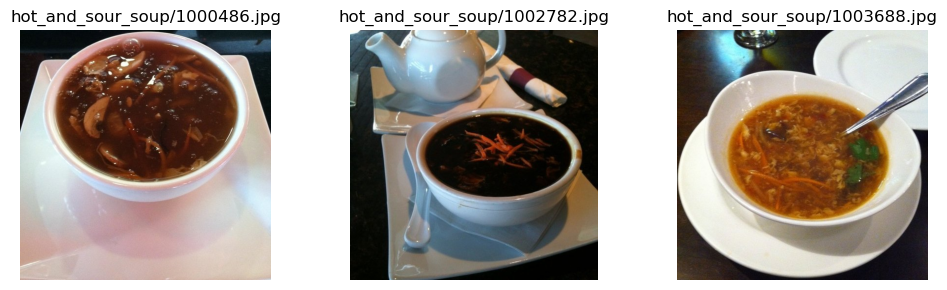

  Subfolder: huevos_rancheros


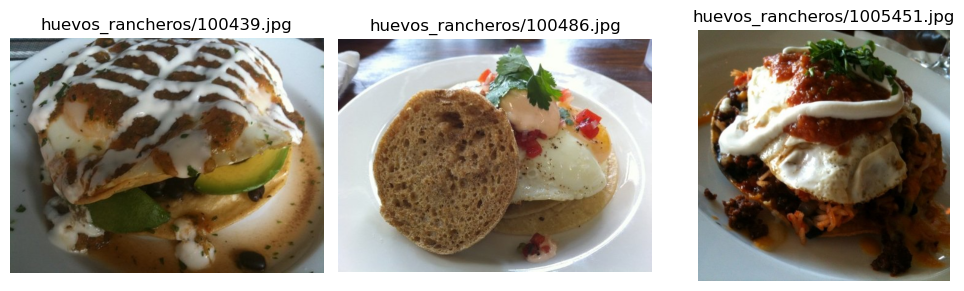

  Subfolder: lasagna


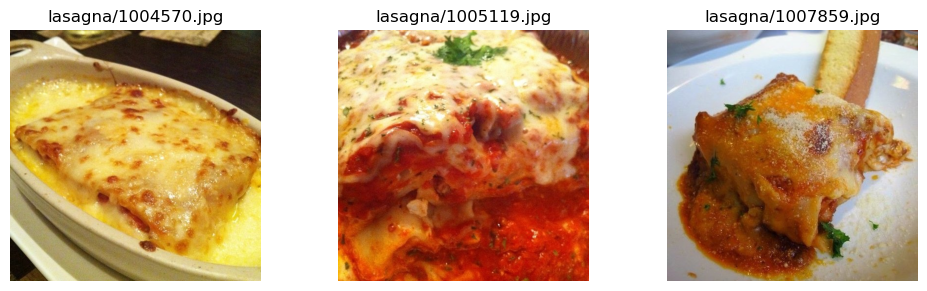

  Subfolder: risotto


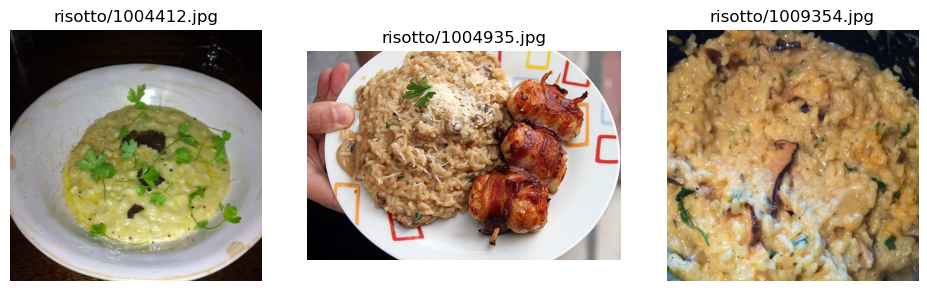

  Subfolder: seaweed_salad


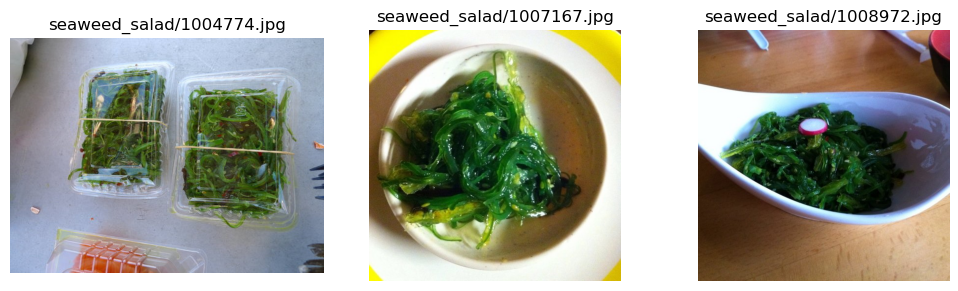

  Subfolder: strawberry_shortcake


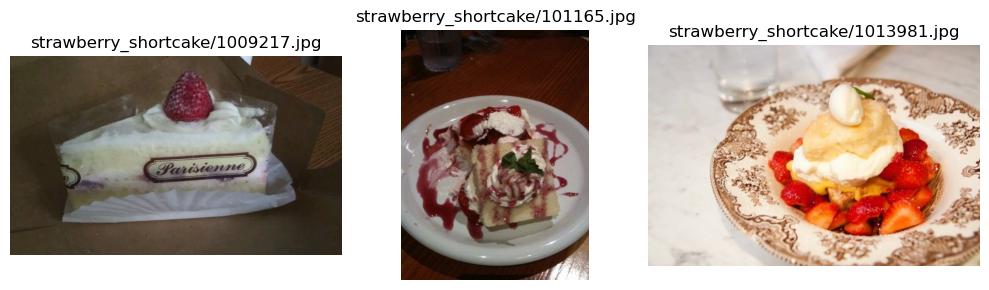

Checking first 3 images in subfolders of: Food/validation
  Subfolder: beet_salad


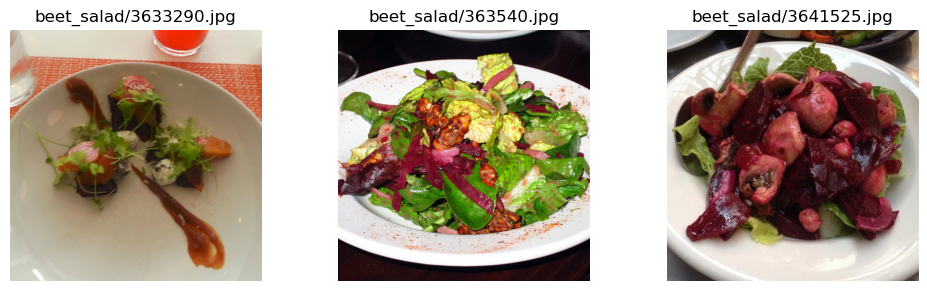

  Subfolder: beignets


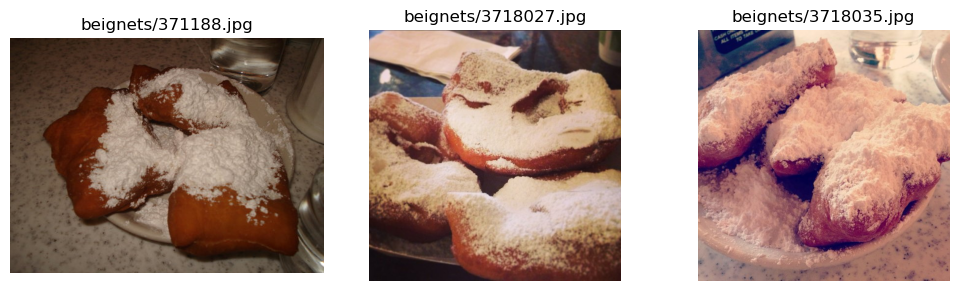

  Subfolder: eggs_benedict


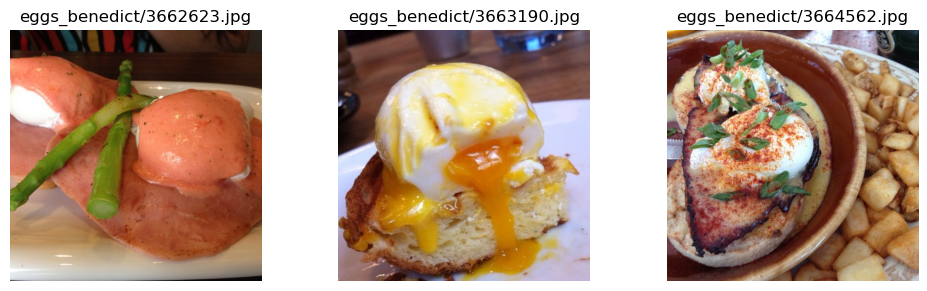

  Subfolder: hamburger


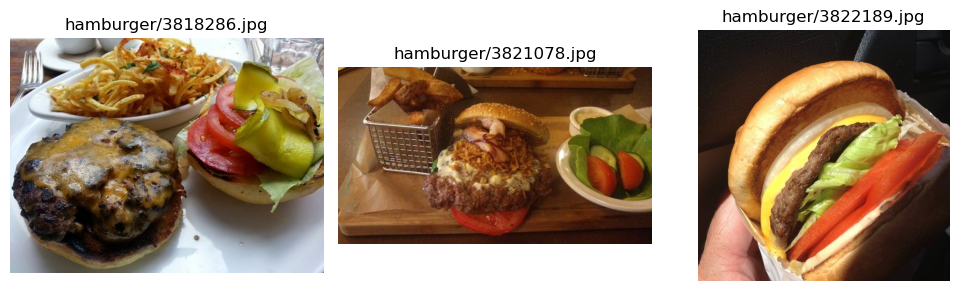

  Subfolder: hot_and_sour_soup


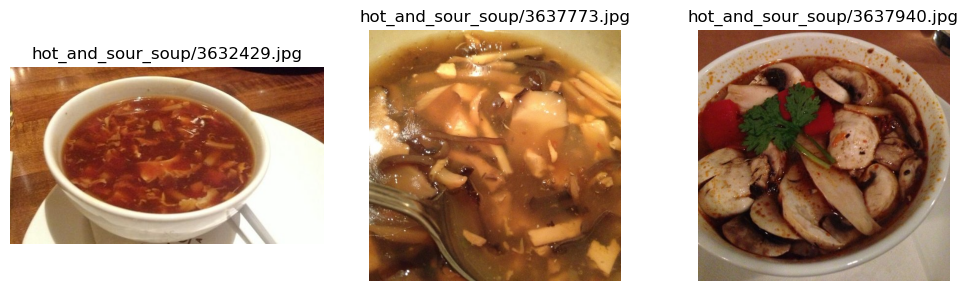

  Subfolder: huevos_rancheros


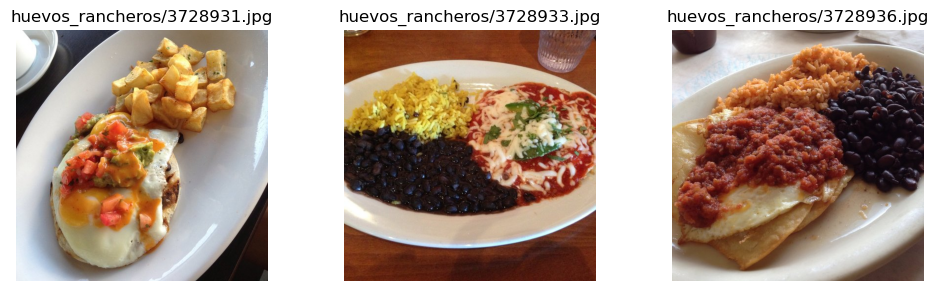

  Subfolder: lasagna


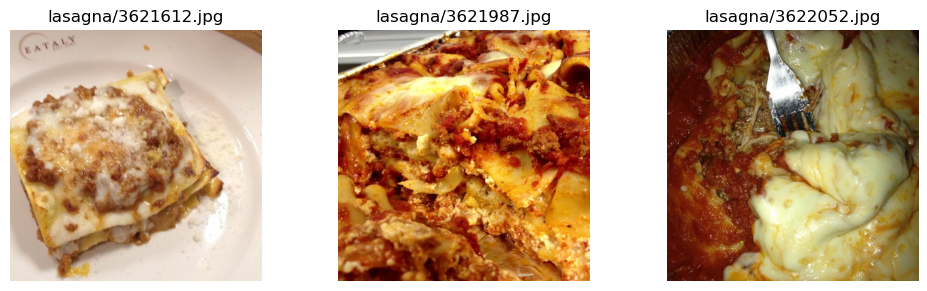

  Subfolder: risotto


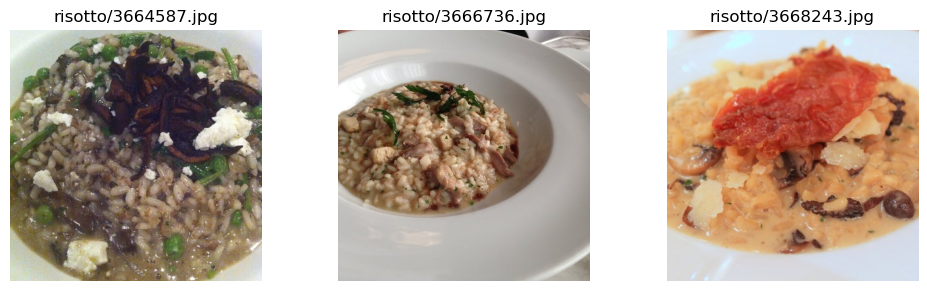

  Subfolder: seaweed_salad


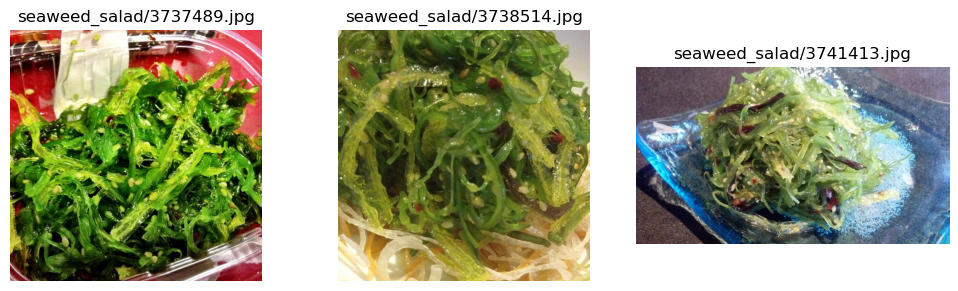

  Subfolder: strawberry_shortcake


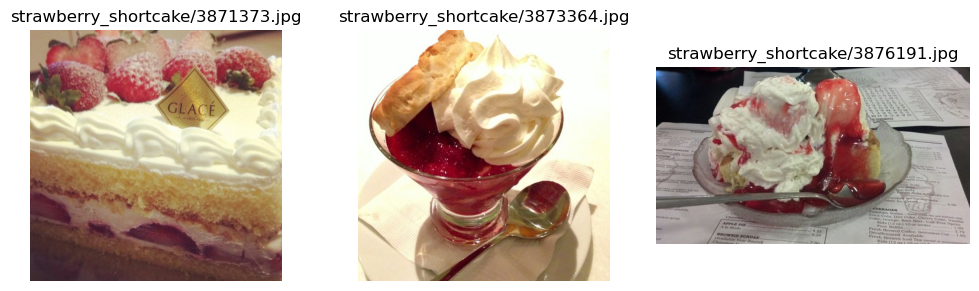

Checking first 3 images in subfolders of: Food/test
  Subfolder: beet_salad


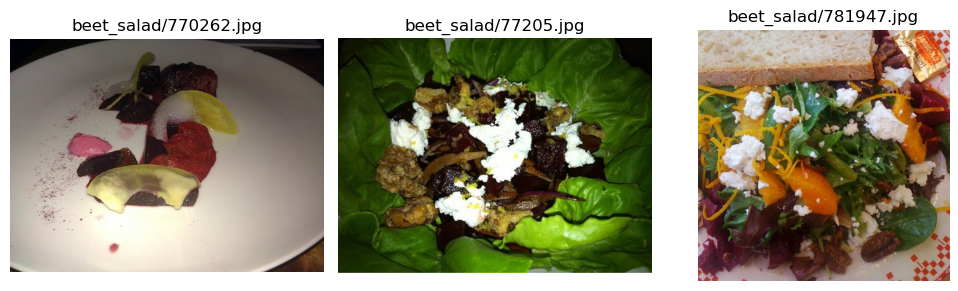

  Subfolder: beignets


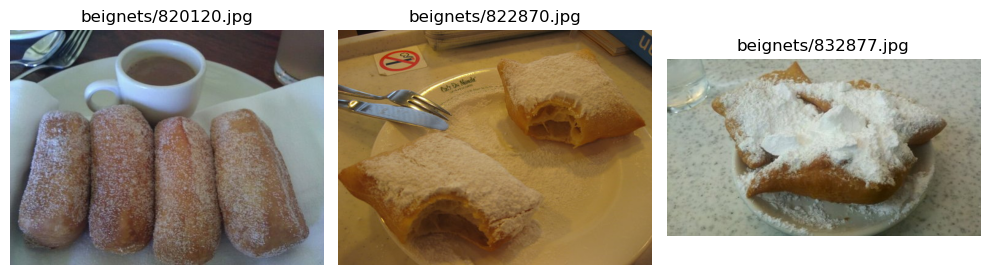

  Subfolder: eggs_benedict


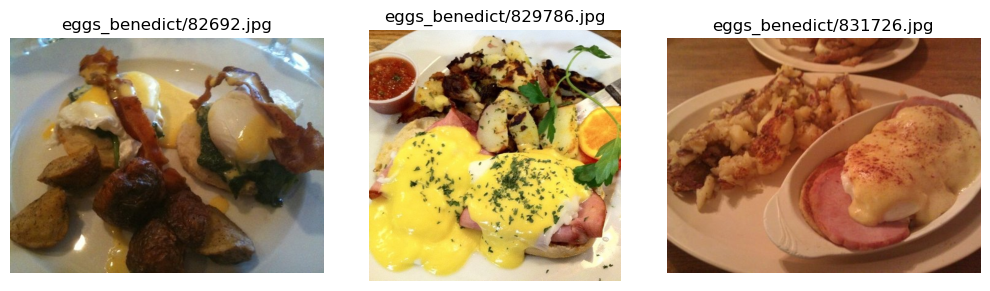

  Subfolder: hamburger


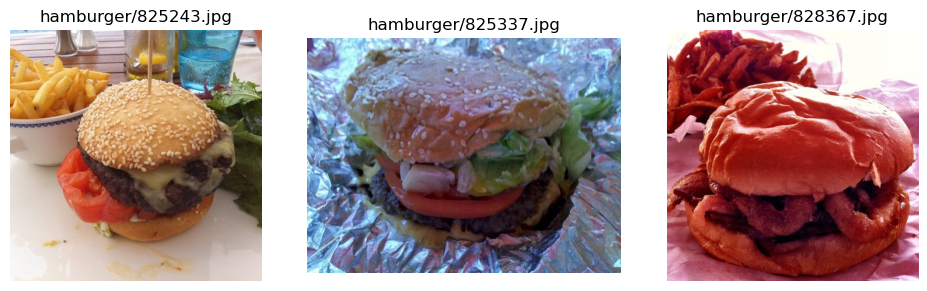

  Subfolder: hot_and_sour_soup


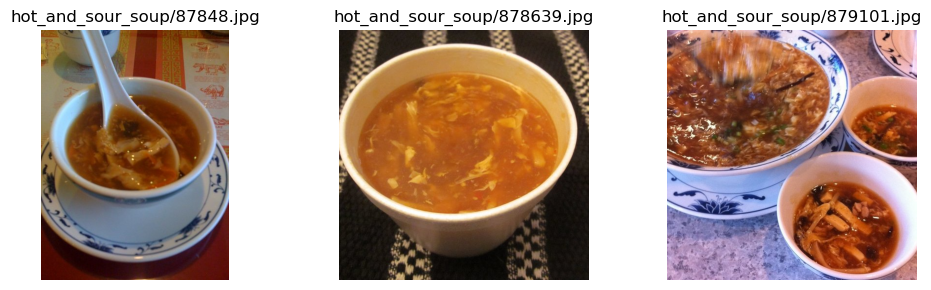

  Subfolder: huevos_rancheros


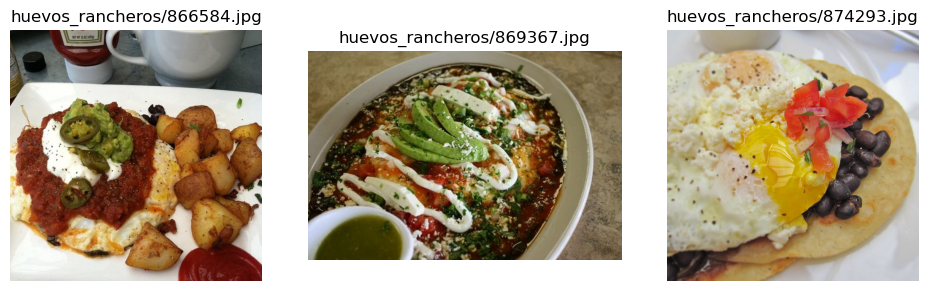

  Subfolder: lasagna


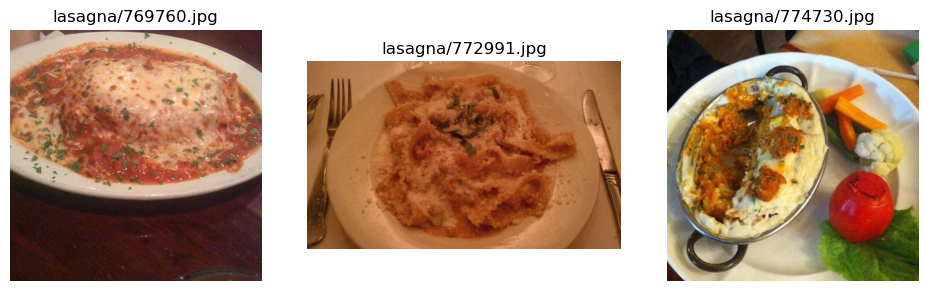

  Subfolder: risotto


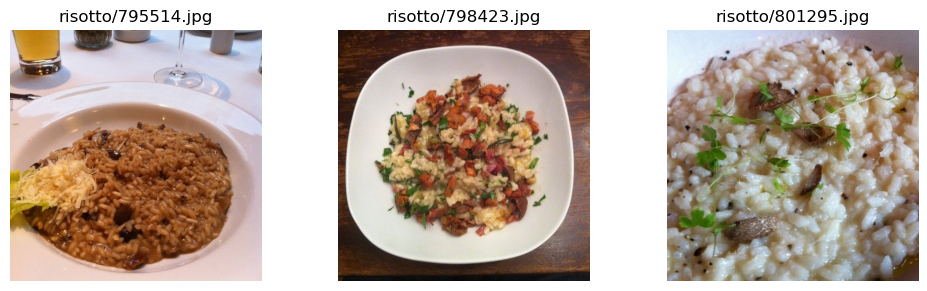

  Subfolder: seaweed_salad


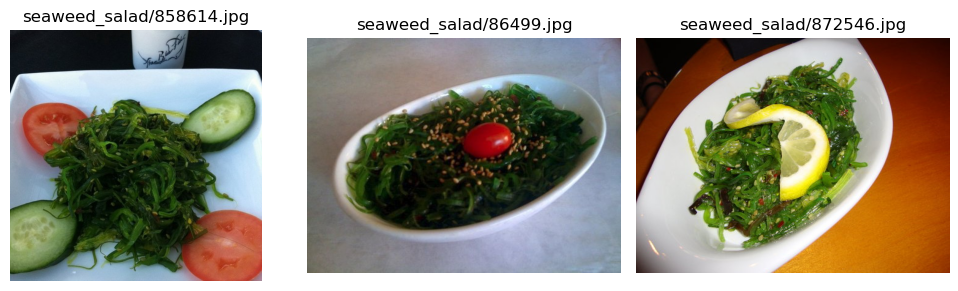

  Subfolder: strawberry_shortcake


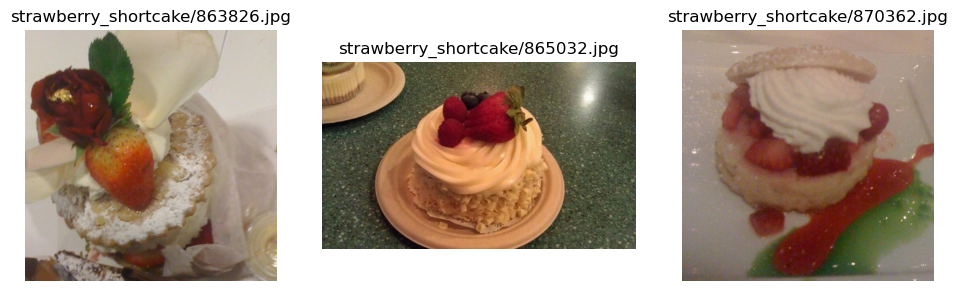

In [ ]:
# view images

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Function to display first N images from each subdirectory within a given path
def display_first_n_images(base_dir, n=3):
    print(f"Checking first {n} images in subfolders of: {base_dir}")
    for subdir in os.listdir(base_dir):
        subdir_path = os.path.join(base_dir, subdir)
        if os.path.isdir(subdir_path):
            print(f"  Subfolder: {subdir}")
            images = [f for f in os.listdir(subdir_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
            images = sorted(images) # Optional: sort to get consistent results
            num_images_to_display = min(n, len(images))

            if num_images_to_display > 0:
                plt.figure(figsize=(10, 3))
                for i in range(num_images_to_display):
                    img_path = os.path.join(subdir_path, images[i])
                    try:
                        img = mpimg.imread(img_path)
                        plt.subplot(1, num_images_to_display, i + 1)
                        plt.imshow(img)
                        plt.title(f"{subdir}/{images[i]}")
                        plt.axis('off')
                    except Exception as e:
                        print(f"    Could not load image {images[i]}: {e}")
                plt.tight_layout()
                plt.show()
            else:
                print("    No images found in this subfolder.")

# Check images in training directory
display_first_n_images(train_dir)

# Check images in validation directory
display_first_n_images(validation_dir)

# Check images in test directory
display_first_n_images(test_dir)

## Count the number of images in each folder

In [ ]:
# Function to count images in subfolders
def count_images_in_subfolders(base_dir):
  print(f"Counting images in subfolders of: {base_dir}")
  total_images = 0
  for subdir in os.listdir(base_dir):
    subdir_path = os.path.join(base_dir, subdir)
    if os.path.isdir(subdir_path):
      images = [f for f in os.listdir(subdir_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
      num_images = len(images)
      print(f"  Subfolder: {subdir} - {num_images} images")
      total_images += num_images
  print(f"Total images in {base_dir}: {total_images}")
  print("-" * 20)


# Count images in training directory
count_images_in_subfolders(train_dir)

# Count images in validation directory
count_images_in_subfolders(validation_dir)

# Count images in test directory
count_images_in_subfolders(test_dir)

Counting images in subfolders of: Food/train
  Subfolder: beet_salad - 750 images
  Subfolder: beignets - 750 images
  Subfolder: eggs_benedict - 750 images
  Subfolder: hamburger - 750 images
  Subfolder: hot_and_sour_soup - 750 images
  Subfolder: huevos_rancheros - 750 images
  Subfolder: lasagna - 750 images
  Subfolder: risotto - 750 images
  Subfolder: seaweed_salad - 750 images
  Subfolder: strawberry_shortcake - 750 images
Total images in Food/train: 7500
--------------------
Counting images in subfolders of: Food/validation
  Subfolder: beet_salad - 200 images
  Subfolder: beignets - 200 images
  Subfolder: eggs_benedict - 200 images
  Subfolder: hamburger - 200 images
  Subfolder: hot_and_sour_soup - 200 images
  Subfolder: huevos_rancheros - 200 images
  Subfolder: lasagna - 200 images
  Subfolder: risotto - 200 images
  Subfolder: seaweed_salad - 200 images
  Subfolder: strawberry_shortcake - 200 images
Total images in Food/validation: 2000
--------------------
Counting ima

### Data augmentation for training

Data augmentation is performed on training images only.

Code includes transformation and normalization of validation and test image datasets.


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#all images resized to 150x150

img_size = 150

# All images will be rescaled by 1./255
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Augmentation parameters for training data only

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.3,
      horizontal_flip=True,
      brightness_range=[0.8,1.2],
      fill_mode='nearest')

# Note that the validation and test data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=25,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=25,
        class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(img_size, img_size),
        batch_size=25,
        class_mode='categorical')

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Found 500 images belonging to 10 classes.


In [ ]:
# checking the shape of the data

for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    break

data batch shape: (25, 150, 150, 3)
labels batch shape: (25, 10)


## **2) Continue to develop the Image Classification Model**

### Model 1-5A

Model from 1-5 in the previous notebook, now trained with augmented training data.

In [ ]:
# required libraries

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu')) # added this layer
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1024, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,115,530 (8.07 MB)

 Trainable params: 2,115,530 (8.07 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 55s 175ms/step - acc: 0.1451 - loss: 3.2008 - val_acc: 0.2955 - val_loss: 2.7558
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.2743 - loss: 2.7495 - val_acc: 0.3205 - val_loss: 2.5759
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3151 - loss: 2.5318 - val_acc: 0.3505 - val_loss: 2.4190
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3358 - loss: 2.3975 - val_acc: 0.3905 - val_loss: 2.2568
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3734 - loss: 2.2523 - val_acc: 0.2820 - val_loss: 2.6452
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3838 - loss: 2.1665 - val_acc: 0.3685 - val_loss: 2.2781
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.4109 - loss: 2.0656 - val_acc: 0.4160 - val_loss: 2.0000
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.4207 - loss: 1.9790 - val_acc: 0.4565 - val_loss: 1.8631
Epoch 9/80
300/300 ━━━━━━━━━━━━━

KeyboardInterrupt: 

In [ ]:
# Save the Model
model.save('food_1_5A.keras')

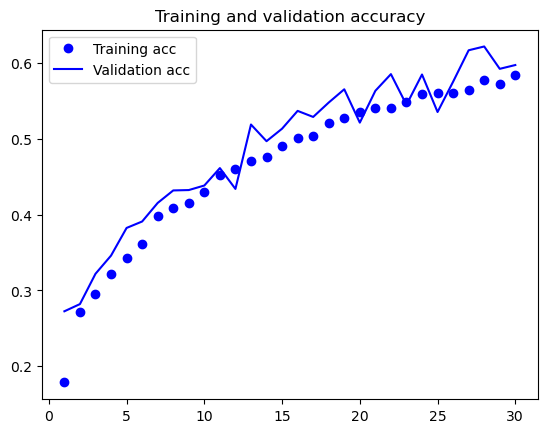

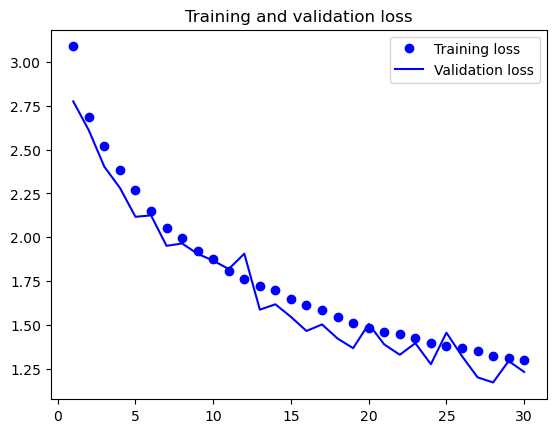

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
test_loss, test_acc = model.evaluate(test_generator, verbose=2)

20/20 - 1s - 45ms/step - acc: 0.6860 - loss: 1.0001


In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_5A.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50)
print('test acc:', test_acc)

50/50 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - acc: 0.6757 - loss: 1.0290
test acc: 0.6859999895095825


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## Model 1-7A

Model from 1-7 in the previous notebook, now trained with augmented training data.

- included dropout
- included L2 regularization
- additional cov2D layer with 256 units
- changed dense layer 1024 units -> 512 units

In [ ]:
from tensorflow.keras import regularizers

# Build the Model

model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu')) #1024 to 512
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()

# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,328,586 (5.07 MB)

 Trainable params: 1,328,586 (5.07 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=50,
      validation_data=validation_generator)

Epoch 1/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 55s 175ms/step - acc: 0.1192 - loss: 2.9212 - val_acc: 0.1980 - val_loss: 2.6270
Epoch 2/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.2586 - loss: 2.5466 - val_acc: 0.2870 - val_loss: 2.3920
Epoch 3/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.2909 - loss: 2.3760 - val_acc: 0.3055 - val_loss: 2.3668
Epoch 4/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 172ms/step - acc: 0.3245 - loss: 2.2468 - val_acc: 0.3750 - val_loss: 2.1084
Epoch 5/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3538 - loss: 2.1642 - val_acc: 0.3460 - val_loss: 2.2063
Epoch 6/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3569 - loss: 2.1059 - val_acc: 0.4065 - val_loss: 1.9515
Epoch 7/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3851 - loss: 2.0277 - val_acc: 0.3930 - val_loss: 1.9646
Epoch 8/50
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.4029 - loss: 1.9695 - val_acc: 0.4280 - val_loss: 1.9012
Epoch 9/50
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_7A_con2Dadd256_drop_L2_dense512.keras')

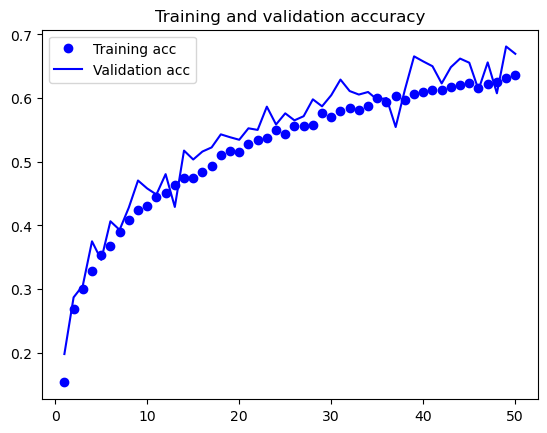

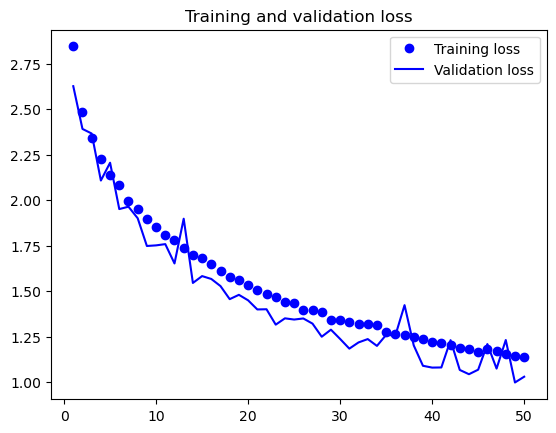

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_7A_con2Dadd256_drop_L2_dense512.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)
print('test acc:', test_acc)

50/50 - 2s - 32ms/step - acc: 0.6780 - loss: 1.0241
test acc: 0.6779999732971191


## Model 1-8A

- included dropout
- included L2 regularization
- additional cov2D layer with 256
- Dense layers with 512 units
- Changed optimizer to Adam

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu')) #1024 to 512
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=2e-5),
              metrics=['acc'])

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_25 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,328,586 (5.07 MB)

 Trainable params: 1,328,586 (5.07 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 56s 175ms/step - acc: 0.1079 - loss: 2.9548 - val_acc: 0.2095 - val_loss: 2.8486
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.1975 - loss: 2.7887 - val_acc: 0.2705 - val_loss: 2.5367
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.2688 - loss: 2.4855 - val_acc: 0.3100 - val_loss: 2.3720
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.2947 - loss: 2.3965 - val_acc: 0.3150 - val_loss: 2.3552
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.2876 - loss: 2.3531 - val_acc: 0.3170 - val_loss: 2.3228
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3093 - loss: 2.3299 - val_acc: 0.3295 - val_loss: 2.2632
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3051 - loss: 2.2976 - val_acc: 0.3335 - val_loss: 2.2540
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3387 - loss: 2.2361 - val_acc: 0.3440 - val_loss: 2.2253
Epoch 9/80
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_8A_con2Dadd256_drop_L2_dense512_adam.keras')

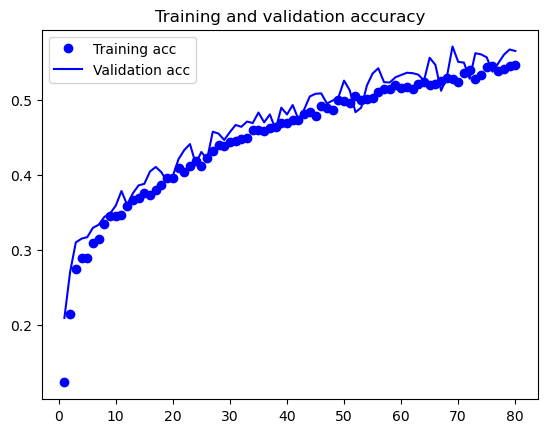

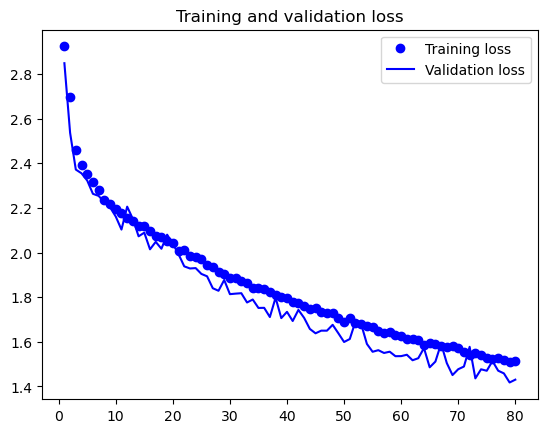

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_8A_con2Dadd256_drop_L2_dense512_adam.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)
print('test acc:', test_acc)

50/50 - 2s - 31ms/step - acc: 0.5780 - loss: 1.4278
test acc: 0.578000009059906


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## Model 1-8A2

- Adam optimizer with higher learning rate

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu')) #1024 to 512
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_30 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,328,586 (5.07 MB)

 Trainable params: 1,328,586 (5.07 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - acc: 0.1233 - loss: 2.8297 - val_acc: 0.2660 - val_loss: 2.3993
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3118 - loss: 2.2449 - val_acc: 0.3870 - val_loss: 2.0404
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.3389 - loss: 2.1315 - val_acc: 0.3505 - val_loss: 2.0563
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 173ms/step - acc: 0.3809 - loss: 2.0202 - val_acc: 0.3940 - val_loss: 1.9541
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.3899 - loss: 1.9721 - val_acc: 0.4345 - val_loss: 1.8729
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - acc: 0.4017 - loss: 1.9261 - val_acc: 0.4205 - val_loss: 1.8806
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.4179 - loss: 1.8737 - val_acc: 0.4160 - val_loss: 1.8885
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 52s 174ms/step - acc: 0.4323 - loss: 1.8370 - val_acc: 0.4695 - val_loss: 1.7452
Epoch 9/80
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_8A_con2Dadd256_drop_L2_dense512_adam1e4.keras')

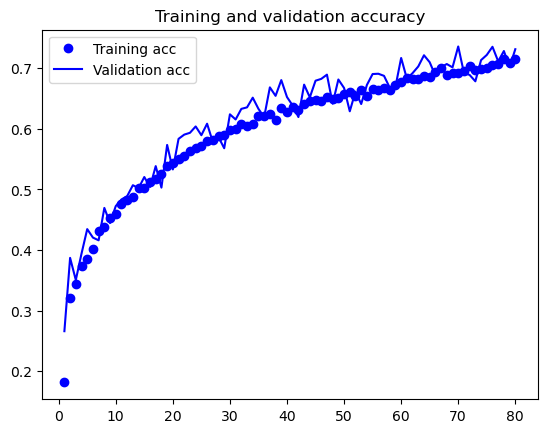

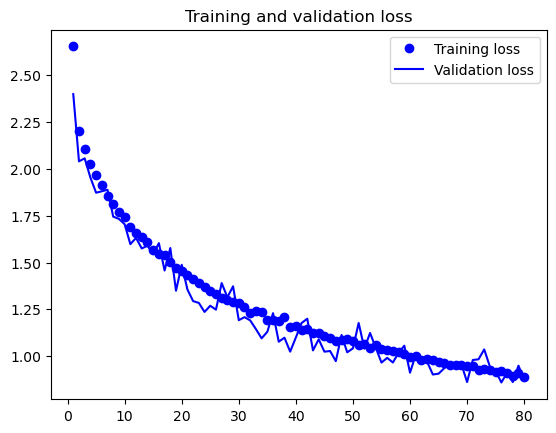

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_8A_con2Dadd256_drop_L2_dense512_adam.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)
print('test acc:', test_acc)

50/50 - 2s - 31ms/step - acc: 0.5780 - loss: 1.4278
test acc: 0.578000009059906


## Model 1-7A2

Added batch normalization into model 1-7A, which is supposed to help stablize the model. Batch normalization was added before the ReLU function after the maxpooling layer.

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.BatchNormalization())
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, kernel_regularizer=regularizers.l2(0.001), activation='relu')) #1024 to 512
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

I0000 00:00:1748309314.304054    1295 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13764 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
W0000 00:00:1748309314.756970    1439 gpu_backend_lib.cc:579] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched for CUDA in the following directories:
  ./cuda_sdk_lib
  ipykernel_launcher.runfiles/cuda_nvcc
  ipykern/cuda_nvcc
  
  /usr/local/cuda
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../../nvidia/cuda_nvcc
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../../../nvidia/cuda_nvcc
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../cuda
  .
You can choose the search directory by setting xla_gpu_cuda_data_dir in HloModule's DebugOptions.  For most apps, setting th

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 74, 74, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 36, 36, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 17, 17, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 7, 7, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,329,994 (5.07 MB)

 Trainable params: 1,329,290 (5.07 MB)

 Non-trainable params: 704 (2.75 KB)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/80


I0000 00:00:1748309328.508216    1429 service.cc:148] XLA service 0x7f373c006250 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748309328.508246    1429 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-05-27 01:28:48.586081: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748309328.839966    1429 cuda_dnn.cc:529] Loaded cuDNN version 90800
2025-05-27 01:28:49.307773: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[25,32,148,148]{3,2,1,0}, u8[0]{0}) custom-call(f32[25,3,150,150]{3,2,1,0}, f32[32,3,3,3]{3,2,1,0}, f32[32]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"

  1/300 ━━━━━━━━━━━━━━━━━━━━ 34:42 7s/step - acc: 0.0400 - loss: 3.3968

I0000 00:00:1748309333.214461    1429 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step - acc: 0.2439 - loss: 2.8254

2025-05-27 01:29:48.427005: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[25,32,148,148]{3,2,1,0}, u8[0]{0}) custom-call(f32[25,3,150,150]{3,2,1,0}, f32[32,3,3,3]{3,2,1,0}, f32[32]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]}
2025-05-27 01:29:48.505674: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[25,64,72,72]{3,2,1,0}, u8[0]{0}) custom-call(f32[25,32,74,74]{3,2,1,0}, f32[64,32,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_con

300/300 ━━━━━━━━━━━━━━━━━━━━ 68s 204ms/step - acc: 0.2441 - loss: 2.8250 - val_acc: 0.1625 - val_loss: 3.1964
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.3549 - loss: 2.5002 - val_acc: 0.4410 - val_loss: 2.2444
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.4010 - loss: 2.3681 - val_acc: 0.4785 - val_loss: 2.1357
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.4307 - loss: 2.2657 - val_acc: 0.5045 - val_loss: 2.0424
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.4681 - loss: 2.1508 - val_acc: 0.5100 - val_loss: 1.9713
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.4835 - loss: 2.0905 - val_acc: 0.5250 - val_loss: 1.9251
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.5096 - loss: 2.0245 - val_acc: 0.5465 - val_loss: 1.8509
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.5193 - loss: 1.9610 - val_acc: 0.5720 - val_loss: 1.7804
Epoch 9/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s

In [ ]:
# Save the Model
model.save('food_1_7A2_batchnorm.keras')

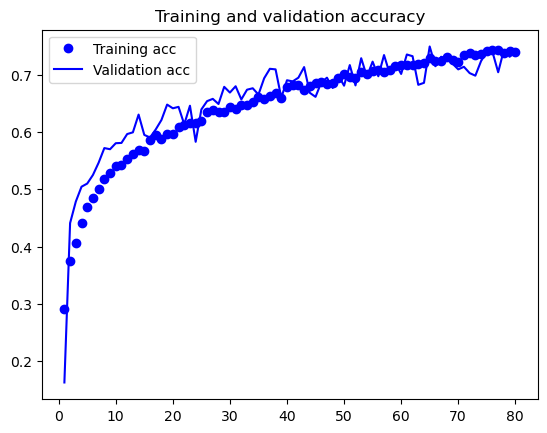

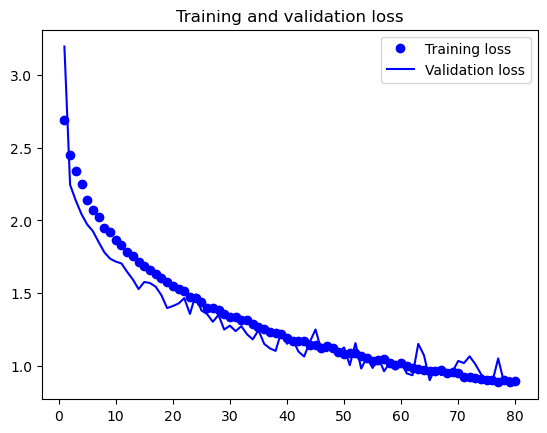

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_7A2_batchnorm.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)

/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


50/50 - 2s - 41ms/step - acc: 0.7280 - loss: 0.9154


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## Model 1-5A2

Batch Normalization added to model 1-5A (after the RELU activation) and before maxpooling.

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1024, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 15, 15, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 5, 5, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,117,962 (8.08 MB)

 Trainable params: 2,116,746 (8.07 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 60s 180ms/step - acc: 0.2348 - loss: 3.3372 - val_acc: 0.1520 - val_loss: 3.6274
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.3282 - loss: 2.9170 - val_acc: 0.3890 - val_loss: 2.7209
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - acc: 0.3873 - loss: 2.7380 - val_acc: 0.4755 - val_loss: 2.4979
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4318 - loss: 2.6361 - val_acc: 0.4655 - val_loss: 2.5373
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4506 - loss: 2.5464 - val_acc: 0.5115 - val_loss: 2.3124
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 178ms/step - acc: 0.4713 - loss: 2.4374 - val_acc: 0.4880 - val_loss: 2.4351
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4884 - loss: 2.3668 - val_acc: 0.5515 - val_loss: 2.1536
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 178ms/step - acc: 0.5051 - loss: 2.3257 - val_acc: 0.5585 - val_loss: 2.1217
Epoch 9/80
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_5A2_batchnorm.keras')

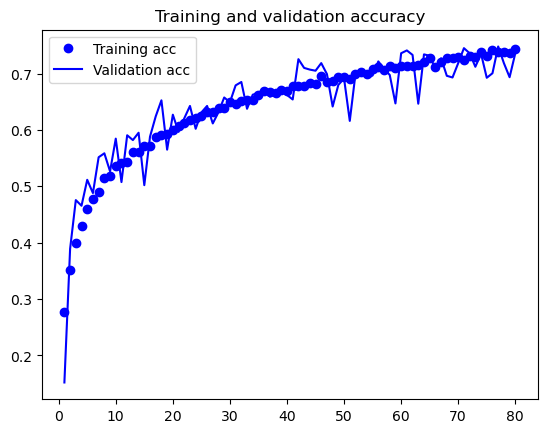

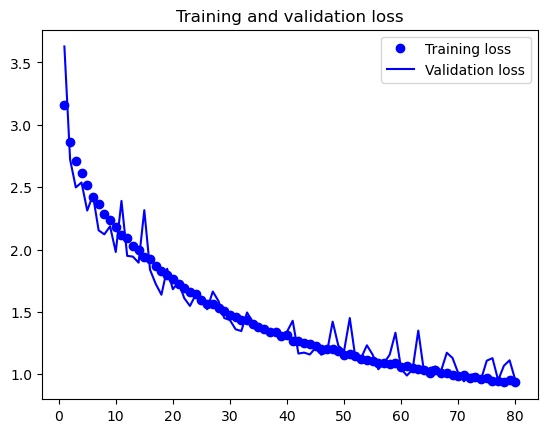

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_5A2_batchnorm.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)

50/50 - 2s - 37ms/step - acc: 0.7300 - loss: 0.9461


In [ ]:
# run it further 40

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=40,
      validation_data=validation_generator)

Epoch 1/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 57s 176ms/step - acc: 0.7343 - loss: 0.9233 - val_acc: 0.7045 - val_loss: 1.0759
Epoch 2/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.7418 - loss: 0.9337 - val_acc: 0.7000 - val_loss: 1.0363
Epoch 3/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.7403 - loss: 0.9104 - val_acc: 0.7135 - val_loss: 1.0281
Epoch 4/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.7375 - loss: 0.9053 - val_acc: 0.7140 - val_loss: 0.9993
Epoch 5/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.7427 - loss: 0.8920 - val_acc: 0.7165 - val_loss: 1.0244
Epoch 6/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.7512 - loss: 0.8805 - val_acc: 0.7245 - val_loss: 0.9927
Epoch 7/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.7597 - loss: 0.8608 - val_acc: 0.7270 - val_loss: 0.9660
Epoch 8/40
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 175ms/step - acc: 0.7517 - loss: 0.8753 - val_acc: 0.7140 - val_loss: 1.1093
Epoch 9/40
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_5A2_cont80plus40_batchnorm.keras')

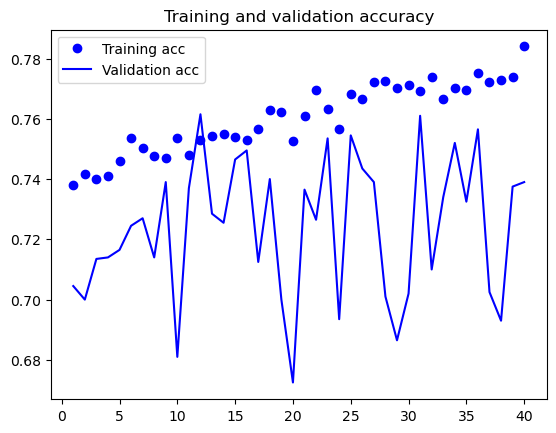

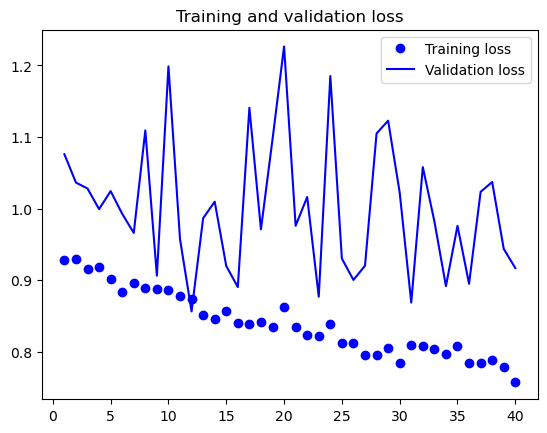

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

There seems to be a slight improvement by placing batch normalization before the maxpooling, rather than after. It was later learned that batch normalization is usually place before maxpooling layer rather than after.

## Model 1-5A3

- Changed activation function to GeLU.

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1024, kernel_regularizer=regularizers.l2(0.001), activation='gelu'))
model.add(layers.Dense(512, activation='gelu'))
model.add(layers.Dense(10, activation='softmax'))

model.summary()

# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

I0000 00:00:1748417981.418967    1235 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13764 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
W0000 00:00:1748417981.858574    1509 gpu_backend_lib.cc:579] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched for CUDA in the following directories:
  ./cuda_sdk_lib
  ipykernel_launcher.runfiles/cuda_nvcc
  ipykern/cuda_nvcc
  
  /usr/local/cuda
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../../nvidia/cuda_nvcc
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../../../nvidia/cuda_nvcc
  /opt/conda/lib/python3.12/site-packages/tensorflow/python/platform/../../cuda
  .
You can choose the search directory by setting xla_gpu_cuda_data_dir in HloModule's DebugOptions.  For most apps, setting th

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 15, 15, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 5, 5, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,117,962 (8.08 MB)

 Trainable params: 2,116,746 (8.07 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/80


I0000 00:00:1748417990.489250    1503 service.cc:148] XLA service 0x7fd260005fb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748417990.489279    1503 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2025-05-28 07:39:50.596957: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1748417990.869018    1503 cuda_dnn.cc:529] Loaded cuDNN version 90800
2025-05-28 07:39:51.363490: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:557] Omitted potentially buggy algorithm eng14{k25=2} for conv (f32[25,32,148,148]{3,2,1,0}, u8[0]{0}) custom-call(f32[25,3,150,150]{3,2,1,0}, f32[32,3,3,3]{3,2,1,0}, f32[32]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"

  1/300 ━━━━━━━━━━━━━━━━━━━━ 40:19 8s/step - acc: 0.1200 - loss: 3.9838

I0000 00:00:1748417995.910723    1503 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


300/300 ━━━━━━━━━━━━━━━━━━━━ 67s 196ms/step - acc: 0.2434 - loss: 3.3183 - val_acc: 0.1560 - val_loss: 4.3279
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - acc: 0.3801 - loss: 2.8379 - val_acc: 0.3250 - val_loss: 3.0304
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - acc: 0.4177 - loss: 2.6916 - val_acc: 0.4735 - val_loss: 2.4522
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - acc: 0.4486 - loss: 2.5794 - val_acc: 0.4935 - val_loss: 2.4146
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - acc: 0.4849 - loss: 2.4378 - val_acc: 0.5240 - val_loss: 2.2370
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - acc: 0.4974 - loss: 2.3721 - val_acc: 0.4885 - val_loss: 2.3838
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - acc: 0.5113 - loss: 2.3034 - val_acc: 0.5835 - val_loss: 2.0886
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s 168ms/step - acc: 0.5358 - loss: 2.2094 - val_acc: 0.5365 - val_loss: 2.1487
Epoch 9/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 50s

In [ ]:
# Save the Model
model.save('food_1_15A3_batchnorm_geluall.keras')

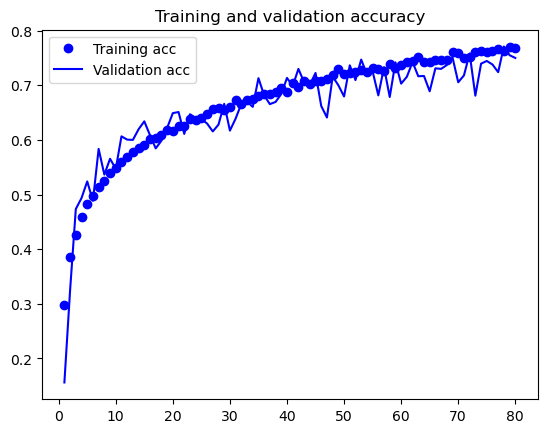

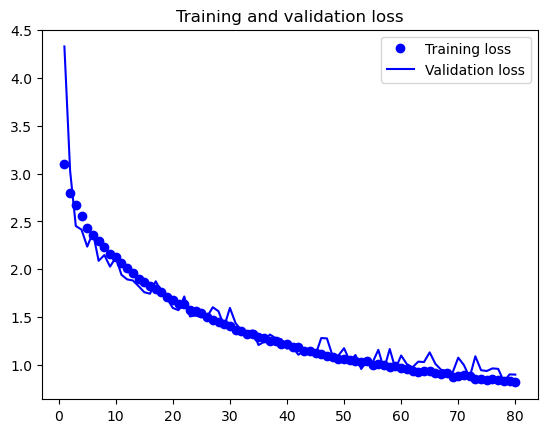

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_15A3_batchnorm_geluall.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)

50/50 - 2s - 41ms/step - acc: 0.7420 - loss: 0.8924


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## Model 1-5A4

- include GeLU activation.
- optimizer changed to Adam

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1024, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Dense(512, activation='gelu'))
model.add(layers.Dense(10, activation='softmax'))


model.summary()


# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.Adam(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 15, 15, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 5, 5, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,117,962 (8.08 MB)

 Trainable params: 2,116,746 (8.07 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 62s 180ms/step - acc: 0.2351 - loss: 3.3791 - val_acc: 0.1495 - val_loss: 3.8506
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 178ms/step - acc: 0.3462 - loss: 2.8706 - val_acc: 0.3345 - val_loss: 2.8860
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 176ms/step - acc: 0.4013 - loss: 2.7052 - val_acc: 0.4520 - val_loss: 2.5054
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4486 - loss: 2.5918 - val_acc: 0.4995 - val_loss: 2.4311
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 178ms/step - acc: 0.4628 - loss: 2.4902 - val_acc: 0.5160 - val_loss: 2.3235
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4858 - loss: 2.4337 - val_acc: 0.5645 - val_loss: 2.1984
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.4998 - loss: 2.3604 - val_acc: 0.5270 - val_loss: 2.2104
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 53s 177ms/step - acc: 0.5325 - loss: 2.2638 - val_acc: 0.5670 - val_loss: 2.1294
Epoch 9/80
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_15A4_batchnorm_gelu_adam.keras')

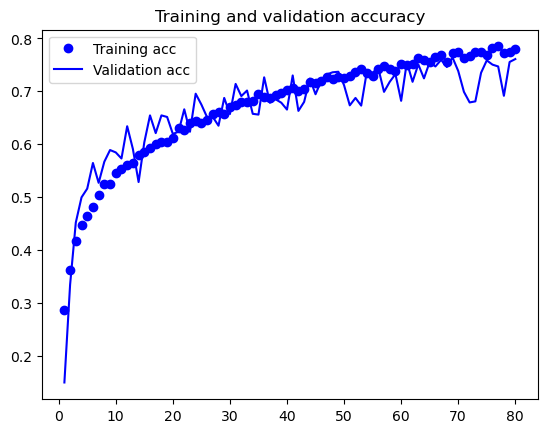

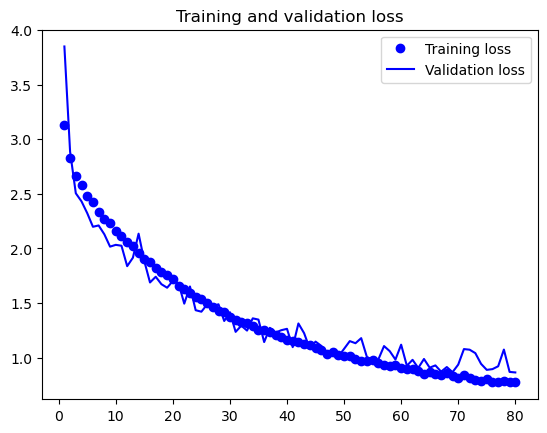

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_15A4_batchnorm_gelu_adam.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)

50/50 - 2s - 39ms/step - acc: 0.7780 - loss: 0.8438


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## Model 1-5A5

- used GeLU activation in convolutional layers.
- used ReLU activation in the classification layers.
- used RMS prop as the optimizer

In [ ]:
from tensorflow.keras import regularizers

# Build the Model


model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(256, (3, 3), activation='gelu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1024, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax'))

model.summary()

# Compile the model

model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 72, 72, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 34, 34, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 15, 15, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 5, 5, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 5, 5, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 2, 2, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 10)             │         5,130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,117,962 (8.08 MB)

 Trainable params: 2,116,746 (8.07 MB)

 Non-trainable params: 1,216 (4.75 KB)

In [ ]:
# Train the Model

history = model.fit(
      train_generator,
      epochs=80,
      validation_data=validation_generator)

Epoch 1/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - acc: 0.2475 - loss: 3.2982 - val_acc: 0.1010 - val_loss: 4.0655
Epoch 2/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - acc: 0.3582 - loss: 2.8693 - val_acc: 0.4245 - val_loss: 2.6165
Epoch 3/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - acc: 0.4065 - loss: 2.7218 - val_acc: 0.4815 - val_loss: 2.4191
Epoch 4/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - acc: 0.4372 - loss: 2.6029 - val_acc: 0.4970 - val_loss: 2.4007
Epoch 5/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - acc: 0.4715 - loss: 2.4625 - val_acc: 0.5570 - val_loss: 2.2083
Epoch 6/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - acc: 0.4885 - loss: 2.3956 - val_acc: 0.5530 - val_loss: 2.1805
Epoch 7/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 161ms/step - acc: 0.5159 - loss: 2.3145 - val_acc: 0.5895 - val_loss: 2.0711
Epoch 8/80
300/300 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - acc: 0.5211 - loss: 2.2563 - val_acc: 0.5655 - val_loss: 2.1127
Epoch 9/80
300/300 ━━━━━━━━━━━━━

In [ ]:
# Save the Model
model.save('food_1_15A5_batchnorm_gelu_relu.keras')

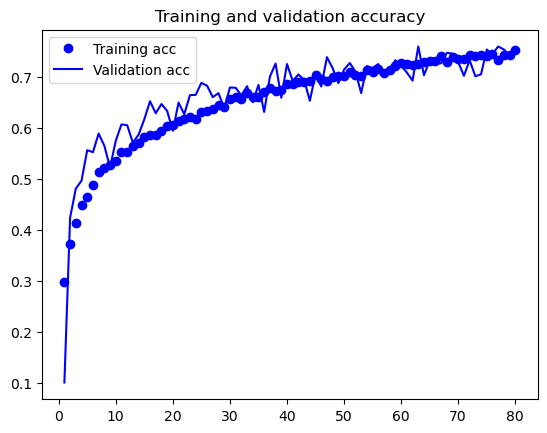

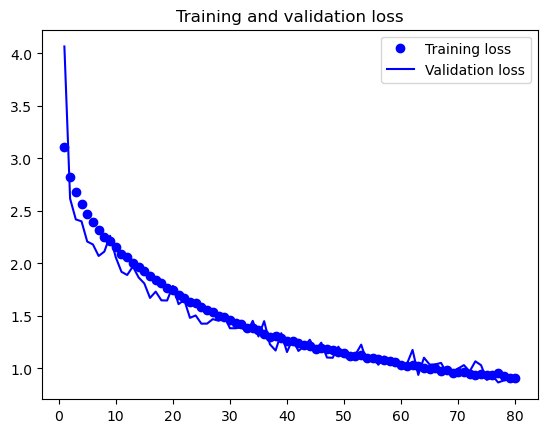

In [ ]:
# Plot the Training and Validation Accuracy & Loss Scores

import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
# Load the model
from tensorflow import keras
model = keras.models.load_model('food_1_15A5_batchnorm_gelu_relu.keras')

test_loss, test_acc = model.evaluate(test_generator, steps=50, verbose=2)

50/50 - 2s - 39ms/step - acc: 0.7620 - loss: 0.9033


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


## **3) Used Model 1-5A5 to make prediction**

In [ ]:
import numpy as np

In [ ]:


# Load the model
model = keras.models.load_model('food_1_15A5_batchnorm_gelu_relu.keras')

In [ ]:
# Load the food list (in alphabetical order)
with open('food_list.txt', 'r') as f:
    x = f.readlines()
food_list =[]
for item in x:
    food_list.append(item.strip('\n'))
food_list = sorted(food_list) # food_list needs to be sorted alphabetically before feed into prediction() function
print(food_list)

['beet_salad', 'beignets', 'eggs_benedict', 'hamburger', 'hot_and_sour_soup', 'huevos_rancheros', 'lasagna', 'risotto', 'seaweed_salad', 'strawberry_shortcake']


In [ ]:
# Define some related functions for image process and model prediction
from tensorflow.keras.preprocessing.image import load_img, img_to_array
def image_process(img):
    image = load_img(img, target_size =(img_size, img_size))
    image_array = img_to_array(image)/255
    return image_array

import pandas as pd
def prediction(model, img_array, items_l):
    prob = model.predict(img_array.reshape(1,img_size,img_size,3))
    pro_df = pd.DataFrame(prob, columns = items_l)
    result = items_l[np.argmax(prob)]
    return pro_df, result

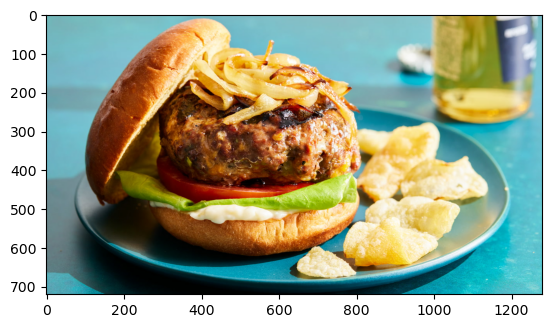

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
The prediction is:  huevos_rancheros 

    beet_salad  beignets  eggs_benedict  hamburger  hot_and_sour_soup  \
0    0.005356  0.004765       0.123203   0.241691           0.014097   

   huevos_rancheros   lasagna   risotto  seaweed_salad  strawberry_shortcake  
0          0.416573  0.149216  0.035538       0.004826              0.004735  


In [ ]:
# Make prediction for the image you downloaded from internet
import matplotlib.pyplot as plt
img = 'hamburger.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)